In [35]:
from google.colab import drive

drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# CONFIG

In [36]:
from google.colab.patches import cv2_imshow


#imshape = (480, 480, 3)
imshape = (640, 640, 3)

BATCH_SIZE = 8
EPOCHS = 100
LEARNING_RATE = 3e-4
LOSS = "dice_loss"
# https://stats.stackexchange.com/questions/349096/cross-entropy-for-comparing-images
# https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2
# => dice gives a greater penalty for false positives (extra pixels that shouldn't have been recognised)
ACTIVATION = "softmax"
model_name = "unet"
backbone = "resnet50"
n_classes = 3

# DATA GENERATOR

In [37]:
import numpy as np
import pickle
import os
from PIL import Image
import imgaug as ia
from imgaug import augmenters as iaa
import cv2
import json
import tensorflow as tf




sometimes = lambda aug: iaa.Sometimes(0.5, aug)

# ia.seed(1)
seq = iaa.Sequential(
    [
        # apply the following augmenters to most images
        iaa.Fliplr(0.3), # horizontally flip 50% of all images
        iaa.Flipud(0.1), # vertically flip 20% of all images
     
        sometimes(iaa.Affine(
                scale = {"x": (0.8, 1.2), "y": (0.8, 1.2)},
                shear = (-15, 15),
                rotate = (-40, 40)
        )),
        # execute 0 to 3 of the following (less important) augmenters per image
        # don't execute all of them, as that would often be way too strong
        iaa.SomeOf((0, 3),
            [
                iaa.OneOf([
                    iaa.GaussianBlur((0, 3.0)), # blur images with a sigma between 0 and 3.0
                    iaa.AverageBlur(k=(2, 7)), # blur image using local means with kernel sizes between 2 and 7
                    iaa.MedianBlur(k=(3, 11)), # blur image using local medians with kernel sizes between 3 and 11
                ]),
                iaa.Sharpen(alpha=(0, 0.5), lightness=(0.75, 1.5)), # sharpen images
                iaa.Emboss(alpha=(0, 0.5), strength=(0, 2.0)), # emboss images
             
                iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5), # add gaussian noise to images
             
                iaa.Add((-10, 10), per_channel=0.5), # change brightness of images (by -10 to 10 of original value)
                iaa.AddToHueAndSaturation((-20, 20)), # change hue and saturation
            
                sometimes(iaa.PerspectiveTransform(scale=(0.0, 0.08)))
            ],
            random_order=True
        )
    ],
    random_order=True
)


class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_paths, annot_paths, batch_size=32,
                 shuffle=True, augment=False, filter=False):
        """Creates a DataGenerator object suited for tensorflow. It feeds the data to the training, 
        generating it each epoch. It makes the data customizable (such as augmentation), and uses 
        way less memory (loading in just parts, not the whole of the dataset)
        Args:
            image_paths (list[str]): Path to the images
            annot_paths (list[str]): Path to the annotations
            batch_size (int, optional): Batch size of the training. Defaults to 32.
            shuffle (bool, optional): Defines whether the data will be shuffled during training. Defaults to True.
            augment (bool, optional): Defines whether the data should be augmented during training. Defaults to False.
        """
        self.image_paths = image_paths
        self.annot_paths = annot_paths
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.augment = augment
        self.filter = filter
        self.on_epoch_end()


    def __len__(self):
        """Calculates the number of batches per epoch
        Returns:
            int: the number of batches per epoch 
        """
        return int(np.floor(len(self.image_paths) / self.batch_size))


    def __getitem__(self, index):
        """Generates indexes of the batch, and feeds the paths to the __data_generation fn
        Args:
            index (int): index of the batch inside the epoch
        Returns:
            np.array, np.array: Input and output matrixes
        """
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        image_paths = [self.image_paths[k] for k in indexes]
        annot_paths = [self.annot_paths[k] for k in indexes]

        X, y = self.__data_generation(image_paths, annot_paths)

        return X, y


    def on_epoch_end(self):
        """Updates (shuffles) the indexes at the end of each epoch
        """
        self.indexes = np.arange(len(self.image_paths))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)


    def create_multi(self, im, shape_dicts):
        """
        updated fn for multiclass cacom
        """

        channels = []
        background = np.zeros(shape=(im.shape[0], im.shape[1]), dtype=np.float32)
        
        for lines in shape_dicts:
            blank = np.zeros(shape=(im.shape[0], im.shape[1]), dtype=np.float32)

            for point1, point2 in zip(lines, lines[1:]):
                cv2.line(blank, tuple(round(x) for x in point1), tuple(round(x) for x in point2), 255, 2)
                cv2.line(background, tuple(round(x) for x in point1), tuple(round(x) for x in point2), 255, 2)
        
            #blank = blank / 255.0
            channels.append(blank)

        _, background = cv2.threshold(background, 127, 255, cv2.THRESH_BINARY_INV)
        channels.append(background)

        Y = np.stack(channels, axis=2) / 255.0
        return Y


    def create_multi_masks(self, im, shape_dicts):
        """Creates one-hot encoded masks form the annotation files
        Args:
            im (np.array): input image
            shape_dicts ([type]): dictionary containing the shapes and the coordinates
        Returns:
            np.array: one-hot encoded ground truth data
        """
        channels = []
        cls = [x['label'] for x in shape_dicts]
        poly = [np.array(x['points'], dtype=np.int32) for x in shape_dicts]
        label2poly = create_label2poly(cls, poly)
        background = np.zeros(shape=(im.shape[0], im.shape[1]), dtype=np.float32)
        # label2poly = dict(zip(cls, poly))
        # print(label2poly)
        # iterate through objects of interest
        for i, label in enumerate(labels):
            blank = np.zeros(shape=(im.shape[0], im.shape[1]), dtype=np.float32)
            if label in cls:
                for shape in label2poly[label]: # a class may have multiple shapes (polygons) -> will be iterated through
                    cv2.fillPoly(blank, [shape], 255)
                    cv2.fillPoly(background, [shape], 255)

            channels.append(blank)

        # handle an image where only background is present
        if 'background' in cls:
            background = np.zeros(shape=(im.shape[0], im.shape[1]), dtype=np.float32)
            cv2.fillPoly(background, [label2poly['background']], 255)
        else:
            _, background = cv2.threshold(background, 127, 255, cv2.THRESH_BINARY_INV)
        channels.append(background)

        Y = np.stack(channels, axis=2) / 255.0

        return Y


    def json_shape_dicts(self, annot_path):
        """Reads in data from a json data
        Args:
            annot_path (str): path of the annotation
        Returns:
            dict: dictionary containing the shapes
        """
        with open(annot_path) as handle:
            shape_dicts = json.load(handle)
        return shape_dicts


    def augment_poly(self, im, shape_dicts):
        """Augments the images and the corresponding annotations
        Args:
            im (np.array): image as numpy array
            shape_dicts (dict): the original dictionary containing the shapes
        Returns:
            np.array, dict: the augmented image and dictionary
        """
        # augments an image and it's polygons

        points = []
        aug_shape_dicts = []
        i = 0

        for line in shape_dicts:
            for coord in line:
                points.append(ia.Keypoint(x=coord[0], y=coord[1]))

            _d = {}
            _d['index'] = (i, i+len(line))
            aug_shape_dicts.append(_d)

            i += len(line)

        keypoints = ia.KeypointsOnImage(points, shape=(imshape[0], imshape[1]))

        seq_det = seq.to_deterministic()
        image_aug = seq_det.augment_images([im])[0]
        keypoints_aug = seq_det.augment_keypoints([keypoints])[0]


        return_shape_dicts = []
        for shape in aug_shape_dicts:
            [start, end] = shape['index']
            aug_points = [[keypoint.x, keypoint.y] for keypoint in keypoints_aug.keypoints[start:end]]
            return_shape_dicts.append(aug_points)

        return image_aug, return_shape_dicts


    def create_mask(self, im, data):
        blank = np.zeros(shape=(im.shape[0], im.shape[1]), dtype=np.float32)
        
        for lines in data:
            for point1, point2 in zip(lines, lines[1:]):
                cv2.line(blank, tuple(round(x) for x in point1), tuple(round(x) for x in point2), 255, 2)
        
        blank = blank / 255.0
    
        return np.expand_dims(blank, axis = 2)


    def laplacian_edge_detection(self, img, ksize):
        laplace = cv2.Laplacian(img,ddepth=cv2.CV_64F, ksize=ksize)
        return np.uint8(laplace)


    def gaussian_blur(self, img, size_kernel = (13,13), sigma=1):
        """Filter the image with a gaussian filter
            Args:
                size_kernel: (width,height) can differ but must be positive and odd
        """
        return cv2.GaussianBlur(img, (size_kernel[0], size_kernel[1]), sigma)


    def preprocess_filter(self, img, gauss_size=(5,5), gauss_sigma = 1, laplace_ksize = 3):
        # apply a gaussian filter to reduce noise
        img_blur = self.gaussian_blur(img, gauss_size, gauss_sigma)
        img_laplace = self.laplacian_edge_detection(img_blur, laplace_ksize)
        return img_laplace


    def __data_generation(self, image_paths, annot_paths):
        """Generates a batch of images and the corresponding masks
        Args:
            image_paths (str): path to the image
            annot_paths (str): path to the annotation
        Returns:
            np.array, np.array: The generated input and output used for the training
        """

        X = np.empty((self.batch_size, imshape[0], imshape[1], imshape[2]), dtype=np.float32)
        Y = np.empty((self.batch_size, imshape[0], imshape[1], n_classes),  dtype=np.float32)

        for i, (im_path, annot_path) in enumerate(zip(image_paths, annot_paths)):
             # read image as grayscale or rgb
            if imshape[2] == 1:
                im = cv2.imread(im_path, 0)
                im = np.expand_dims(im, axis=2)
            elif imshape[2] == 3:
                im = cv2.imread(im_path, 1)
                im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
            

            shape_dicts = self.json_shape_dicts(annot_path)

            # check for augmentation
            if self.augment:
                im, shape_dicts = self.augment_poly(im, shape_dicts)
            # further preprocessing (filtering)
            if self.filter:
                im = self.preprocess_filter(im)

            # create target masks
            mask = self.create_multi(im, shape_dicts)

            #im = np.expand_dims(im, axis=2)
            X[i,] = im
            Y[i,] = mask
        
        return X, Y

# TENSORBOARD

In [38]:
!pip install tensorboardcolab

  Created wheel for tensorboardcolab: filename=tensorboardcolab-0.0.22-py3-none-any.whl size=3859 sha256=669ce22fd7cb96ad6e98e24d64914069b765bcad9c28cef2c24b766d5fd703bd
  Stored in directory: /root/.cache/pip/wheels/69/4e/4a/1c6c267395cb10edded1050df12af165d3254cfce324e80941
Successfully built tensorboardcolab


In [42]:
%load_ext tensorboard
%tensorboard --logdir /content/gdrive/MyDrive/CACoM_multi/models/2022-03-09_19:38:55/logs

<IPython.core.display.Javascript object>

# MODEL - UNET

In [39]:
!pip install keras_applications

In [40]:
from keras_applications import get_submodules_from_kwargs
import os
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, ResNet101, ResNet152, MobileNet, MobileNetV2#, InceptionV3, InceptionResNetV2

import tensorflow
import tensorflow.keras.layers as k_layers
from tensorflow.keras.models import load_model

backend = tensorflow.keras.backend
layers = tensorflow.keras.layers
models = tensorflow.keras.models
keras_utils = tensorflow.keras.utils

def get_submodules():
    return {
        'backend': backend,
        'models': models,
        'layers': layers,
        'utils': keras_utils,
    }


def Conv2dBn(
        filters,
        kernel_size,
        strides=(1, 1),
        padding='valid',
        data_format=None,
        dilation_rate=(1, 1),
        activation=None,
        kernel_initializer='glorot_uniform',
        bias_initializer='zeros',
        kernel_regularizer=None,
        bias_regularizer=None,
        activity_regularizer=None,
        kernel_constraint=None,
        bias_constraint=None,
        use_batchnorm=False,
        **kwargs):
    """Extension of Conv2D layer with batchnorm"""

    conv_name, act_name, bn_name = None, None, None
    block_name = kwargs.pop('name', None)
    backend, layers, models, keras_utils = get_submodules_from_kwargs(kwargs)

    if block_name is not None:
        conv_name = block_name + '_conv'

    if block_name is not None and activation is not None:
        act_str = activation.__name__ if callable(activation) else str(activation)
        act_name = block_name + '_' + act_str

    if block_name is not None and use_batchnorm:
        bn_name = block_name + '_bn'

    bn_axis = 3

    def wrapper(input_tensor):

        x = k_layers.Conv2D(
            filters=filters,
            kernel_size=kernel_size,
            strides=strides,
            padding=padding,
            data_format=data_format,
            dilation_rate=dilation_rate,
            activation=None,
            use_bias=not (use_batchnorm),
            kernel_initializer=kernel_initializer,
            bias_initializer=bias_initializer,
            kernel_regularizer=kernel_regularizer,
            bias_regularizer=bias_regularizer,
            activity_regularizer=activity_regularizer,
            kernel_constraint=kernel_constraint,
            bias_constraint=bias_constraint,
            name=conv_name,
        )(input_tensor)

        if use_batchnorm:
            x = k_layers.BatchNormalization(axis=bn_axis, name=bn_name)(x)

        if activation:
            x = k_layers.Activation(activation, name=act_name)(x)

        return x

    return wrapper

def Conv3x3BnReLU(filters, use_batchnorm, name=None):
    kwargs = get_submodules()

    def wrapper(input_tensor):
        return Conv2dBn(
            filters,
            kernel_size=3,
            activation='relu',
            kernel_initializer='he_uniform',
            padding='same',
            use_batchnorm=use_batchnorm,
            name=name,
            **kwargs
        )(input_tensor)

    return wrapper

def DecoderUpsamplingX2Block(filters, stage, use_batchnorm=False):
    up_name = 'decoder_stage{}_upsampling'.format(stage)
    conv1_name = 'decoder_stage{}a'.format(stage)
    conv2_name = 'decoder_stage{}b'.format(stage)
    concat_name = 'decoder_stage{}_concat'.format(stage)

    concat_axis = 3

    def wrapper(input_tensor, skip=None):
        x = k_layers.UpSampling2D(size=2, name=up_name)(input_tensor)

        if skip is not None:
            x = k_layers.Concatenate(axis=concat_axis, name=concat_name)([x, skip])

        x = Conv3x3BnReLU(filters, use_batchnorm, name=conv1_name)(x)
        x = Conv3x3BnReLU(filters, use_batchnorm, name=conv2_name)(x)

        return x

    return wrapper

def DecoderTransposeX2Block(filters, stage, use_batchnorm=False):
    transp_name = 'decoder_stage{}a_transpose'.format(stage)
    bn_name = 'decoder_stage{}a_bn'.format(stage)
    relu_name = 'decoder_stage{}a_relu'.format(stage)
    conv_block_name = 'decoder_stage{}b'.format(stage)
    concat_name = 'decoder_stage{}_concat'.format(stage)

    concat_axis = bn_axis = 3

    def layer(input_tensor, skip=None):

        x = k_layers.Conv2DTranspose(
            filters,
            kernel_size=(4, 4),
            strides=(2, 2),
            padding='same',
            name=transp_name,
            use_bias=not use_batchnorm,
        )(input_tensor)

        if use_batchnorm:
            x = k_layers.BatchNormalization(axis=bn_axis, name=bn_name)(x)

        x = k_layers.Activation('relu', name=relu_name)(x)

        if skip is not None:
            x = k_layers.Concatenate(axis=concat_axis, name=concat_name)([x, skip])

        x = Conv3x3BnReLU(filters, use_batchnorm, name=conv_block_name)(x)

        return x

    return layer


def freeze_model(model, **kwargs):
    """Set all layers non trainable, excluding BatchNormalization layers"""
    _, layers, _, _ = get_submodules_from_kwargs(kwargs)
    for layer in model.layers:
        if not isinstance(layer, k_layers.BatchNormalization):
            layer.trainable = False
    return

def filter_keras_submodules(kwargs):
    """Selects only arguments that define keras_application submodules. """
    submodule_keys = kwargs.keys() & {'backend', 'layers', 'models', 'utils'}
    return {key: kwargs[key] for key in submodule_keys}

default_feature_layers = {
    # VGG
    'vgg16': ('block5_conv3', 'block4_conv3', 'block3_conv3', 'block2_conv2', 'block1_conv2'),
    'vgg19': ('block5_conv4', 'block4_conv4', 'block3_conv4', 'block2_conv2', 'block1_conv2'),
    # ResNets
    'resnet18': ('conv4_block1_1_relu', 'conv3_block1_1_relu', 'conv2_block1_1_relu', 'conv1_relu'),
    'resnet34': ('conv4_block1_1_relu', 'conv3_block1_1_relu', 'conv2_block1_1_relu', 'conv1_relu'),
    'resnet50': ('conv4_block1_1_relu', 'conv3_block1_1_relu', 'conv2_block1_1_relu', 'conv1_relu'),
    'resnet101': ('conv4_block1_1_relu', 'conv3_block1_1_relu', 'conv2_block1_1_relu', 'conv1_relu'),
    'resnet152': ('conv4_block1_1_relu', 'conv3_block1_1_relu', 'conv2_block1_1_relu', 'conv1_relu'),
    # Mobile Nets
    'mobilenet': ('conv_pw_11_relu', 'conv_pw_5_relu', 'conv_pw_3_relu', 'conv_pw_1_relu'),
    'mobilenetv2': ('block_13_expand_relu', 'block_6_expand_relu', 'block_3_expand_relu',
                        'block_1_expand_relu'),
    #Inception
    'inceptionv3': (228, 86, 16, 9),
    'inceltionresnetv2': (596, 260, 16, 9)
}
"""
# ResNets
'resnet18': ('stage4_unit1_relu1', 'stage3_unit1_relu1', 'stage2_unit1_relu1', 'relu0'),
'resnet34': ('stage4_unit1_relu1', 'stage3_unit1_relu1', 'stage2_unit1_relu1', 'relu0'),
'resnet50': ('stage4_unit1_relu1', 'stage3_unit1_relu1', 'stage2_unit1_relu1', 'relu0'),
'resnet101': ('stage4_unit1_relu1', 'stage3_unit1_relu1', 'stage2_unit1_relu1', 'relu0'),
'resnet152': ('stage4_unit1_relu1', 'stage3_unit1_relu1', 'stage2_unit1_relu1', 'relu0'),
"""


backbones = {
    'vgg16': VGG16,
    'vgg19': VGG19,
    'resnet50': ResNet50,
    'resnet101': ResNet101,
    'resnet152': ResNet152,
    'mobilenet': MobileNet,
    'mobilenetv2': MobileNetV2,
    #'inceptionv3': InceptionV3,
    #'inceptionresnetv2': InceptionResNetV2
}

"""
UNET DECODER
"""
def build_unet(
        backbone,
        decoder_block,
        skip_connection_layers,
        decoder_filters=(256, 128, 64, 32, 16),
        n_upsample_blocks=5,
        classes=1,
        activation='sigmoid',
        use_batchnorm=True):

    input_ = backbone.input
    x = backbone.output
    
    #extract skip connections
    skips = ([backbone.get_layer(name=i).output if isinstance(i, str)
              else backbone.get_layer(index=i).output for i in skip_connection_layers])

    # add center block if previous operation was maxpooling (for vgg models)
    
    if isinstance(backbone.layers[-1].__class__.__name__, k_layers.MaxPooling2D):
        x = Conv3x3BnReLU(512, use_batchnorm, name='center_block1')(x)
        x = Conv3x3BnReLU(512, use_batchnorm, name='center_block2')(x)

    # building decoder blocks
    for i in range(n_upsample_blocks):
        if i < len(skips):
            skip = skips[i]
        else:
            skip = None

        x = decoder_block(decoder_filters[i], stage=i, use_batchnorm=use_batchnorm)(x, skip)

    # model head (define number of output classes)
    x = k_layers.Conv2D(
        filters=classes,
        kernel_size=(3, 3),
        padding='same',
        use_bias=True,
        kernel_initializer='glorot_uniform',
        name='final_conv',
    )(x)
    x = k_layers.Activation(activation, name=activation)(x)

    # create keras model instance
    model = tensorflow.keras.models.Model(input_, x)

    return model

def Unet(backbone_name='vgg16',
        input_shape=(None, None, 3),
        classes=1,
        activation='sigmoid',
        weights=None,
        encoder_weights='imagenet',
        encoder_freeze=False,
        encoder_features='default',
        decoder_block_type='upsampling',
        decoder_filters=(256, 128, 64, 32, 16),
        decoder_use_batchnorm=True,
        continue_training = False,
        model_path = '',
        **kwargs):


    """
    Args:
        backbone_name: name of the encoder / feature extractor
        input_shape: (H, W, C). If H & W are not set, it can process any size (must be divisible by 32)
        classes: nr of classes for output
        activation: activation fn.
        weights: optional, path to model weights
        encoder_weights: None (random init) or imagenet (pre-trained on imagenet)
        encoder_freeze: if True, backbone layers are not trainable
        encoder_features: a list of layer numbers or names starting from top of the model.
            Each of these layers will be concatenated with corresponding decoder block. If ``default`` is used
            layer names are taken from ``DEFAULT_SKIP_CONNECTIONS``.
        decoder_block_type:
            - `upsampling`:  ``UpSampling2D`` -> ``Conv2D`` -> ``Conv2D``
            - `transpose`:   ``Transpose2D`` -> ``Conv2D`
        decoder_filters: list of numbers of ``Conv2D`` layer filters in decoder blocks
        decoder_use_batchnorm: if ``True``, ``BatchNormalisation`` layer between ``Conv2D`` and ``Activation`` layers
            is used.
    
    """
    if continue_training:
        if os.path.exists(model_path):
            model = load_model(model_path, compile = False)
            model.summary()
            return model
        else:
            print('Failed to load existing model at: {}'.format(model_path))

    global backend, layers, models, keras_utils
    submodule_args = filter_keras_submodules(kwargs)
    backend, layers, models, keras_utils = get_submodules_from_kwargs(submodule_args)


    if decoder_block_type == 'upsampling':
        decoder_block = DecoderUpsamplingX2Block
    elif decoder_block_type == 'transpose':
        decoder_block = DecoderTransposeX2Block
    else:
        raise ValueError('Decoder block type should be in ("upsampling", "transpose"). '
                         'Got: {}'.format(decoder_block_type))

    backbone = backbones[backbone_name](
        input_shape=input_shape,
        weights=encoder_weights,
        include_top=False,
        **kwargs)

    if encoder_features == 'default':
        encoder_features = default_feature_layers[backbone_name][:4]

    model = build_unet(
        backbone=backbone,
        decoder_block=decoder_block,
        skip_connection_layers=encoder_features,
        decoder_filters=decoder_filters,
        classes=classes,
        activation=activation,
        n_upsample_blocks=len(decoder_filters),
        use_batchnorm=decoder_use_batchnorm,
    )

    if encoder_freeze:
        freeze_model(backbone, **kwargs)

    if weights is not None:
        model.load_weights(weights)

    return model

# UTIL

In [41]:
def sorted_files(dir):
    """Sorts the files in a given directory

    Args:
        dir (str): directory path to be sorted

    Returns:
        list: list of sorted elements in a directory
    """
    #return sorted(os.listdir(dir), key=lambda x: int(x.split('.')[0].split('_')[1]))
    return sorted(os.listdir(dir), key=lambda x: int(x.split('.')[0].split('_')[1]))


def return_paths():
    dim_folder = "dim" + str(imshape[0])
    train_img_path = os.path.join('/content/gdrive/MyDrive/CACoM_multi/data', 'train_set', 'images')
    train_annot_path = os.path.join('/content/gdrive/MyDrive/CACoM_multi/data', 'train_set', 'annotations')

    val_img_path = os.path.join('/content/gdrive/MyDrive/CACoM_multi/data', 'validation_set', 'images')
    val_annot_path = os.path.join('/content/gdrive/MyDrive/CACoM_multi/data', 'validation_set', 'annotations')


    train_imgs = [os.path.join(train_img_path, x) for x in sorted(os.listdir(train_img_path))]
    train_annots = [os.path.join(train_annot_path, x) for x in sorted(os.listdir(train_annot_path))]

    val_imgs = [os.path.join(val_img_path, x) for x in sorted(os.listdir(val_img_path))]
    val_annots = [os.path.join(val_annot_path, x) for x in sorted(os.listdir(val_annot_path))]

    assert len(train_imgs) == len(train_annots) and len(val_imgs) == len(val_annots),\
    "The number of files in training or validation is different."

    return train_imgs, train_annots, val_imgs, val_annots

def create_config_json(train_dir, timestamp):  
    if isinstance(LOSS, str):
        loss_name = LOSS
    else:
        loss_name = LOSS.__name__
        
    info = {"model_name": model_name,
            "backbone": backbone,
            "freeze_backbone": False,
            "date": timestamp.split("_")[0],
            "time": timestamp.split("_")[1],
            "initial_lr": LEARNING_RATE,
            "loss_fn": loss_name,
            "image_size": imshape[0],
            "epoch": EPOCHS,
            "batch_size": BATCH_SIZE
            }

    filename = "config.json"
    with open(os.path.join(train_dir, filename), "w") as outfile:
        json.dump(info, outfile)



# FIT

In [ ]:
import os
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.metrics import MeanIoU, Precision, PrecisionAtRecall, Recall, AUC
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
import pytz
import shutil
import datetime
from decimal import Decimal

def dice(y_true, y_pred, smooth=1.):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_loss(y_true, y_pred):
    return 1 - dice(y_true, y_pred)


def dice_thresh(y_true, y_pred, smooth=1.):
    y_true_f = K.flatten(y_true)
    threshold_indices = y_pred>0.005
    y_pred[threshold_indices] = 0
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    

def iou(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f + y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)


#get list of image and annot paths
train_imgs, train_annots, val_imgs, val_annots = return_paths()



#create generator for training data
#tg = DataGenerator(image_paths = train_imgs, annot_paths=train_annots, batch_size = BATCH_SIZE, augment = True)
tg = DataGenerator(image_paths = train_imgs, annot_paths=train_annots, batch_size = BATCH_SIZE, augment = True, filter = False)

#create generator for validation data
vg = DataGenerator(image_paths = val_imgs, annot_paths = val_annots, batch_size = BATCH_SIZE, augment = False, filter = False)


model = Unet(backbone_name="resnet50", input_shape=imshape, classes=n_classes, activation=ACTIVATION, encoder_freeze=False)



# CONTINUE TRAINING
#old_checkpoint_path = "/content/gdrive/MyDrive/CACoM/models/2022-02-06_13:48:57/model.h5"
#model.load_weights(old_checkpoint_path)
# END CONTINUE TRAINING

model.compile(optimizer=Adam(LEARNING_RATE),
                loss=dice_loss,
                #metrics=[dice_loss, iou])
                metrics=["categorical_crossentropy", iou])


timezone = pytz.timezone("Europe/Berlin")
timestamp = str(datetime.datetime.now(timezone).strftime("%Y-%m-%d_%H:%M:%S"))
os.mkdir('/content/gdrive/MyDrive/CACoM_multi/models/' + timestamp)
training_dir = '/content/gdrive/MyDrive/CACoM_multi/models/' + timestamp
# checkpoint_path = os.path.join(training_dir, 'model', 'cp.ckpt')
checkpoint_path = os.path.join(training_dir, 'model.h5')
# checkpoint_dir = os.path.dirname(checkpoint_path)


tensorboard_callback = TensorBoard(os.path.join(training_dir, 'logs'), histogram_freq=1)

checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, mode='min',
                             save_best_only=True, save_weights_only=True)

#checkpoint_abort = EarlyStopping(monitor = 'val_loss', patience = 22, verbose = 1)

#LR_scheduler = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 25,
#                                 verbose = 1, cooldown = 5, min_lr = 0.0000001)

#tb_mask = TensorBoardMask(log_freq = 20, train_dir = training_dir, test_image = val_imgs[0])

#lr_schedule = tf.keras.callbacks.LearningRateScheduler(
#    lambda epoch: 1e-8 * 10**(epoch / 20), verbose = 1)

callbacks = [
             tensorboard_callback,
             checkpoint,
             #checkpoint_abort,
             #LR_scheduler,
             #tb_mask
             ]

# callback to find out optimal learning rate
# callbacks = [lr_schedule]

create_config_json(training_dir, timestamp)

model_history = model.fit(x=tg,
                          validation_data = vg,
                          steps_per_epoch=len(tg),
                          epochs=EPOCHS,
                          verbose=1,
                          callbacks=callbacks
                          )

94781440/94765736 [==============================] - 3s 0us/step
Epoch 1/100
28/28 [==============================] - ETA: 0s - loss: 0.3582 - categorical_crossentropy: 0.6369 - iou: 0.4816
Epoch 1: val_loss improved from inf to 0.23016, saving model to /content/gdrive/MyDrive/CACoM_multi/models/2022-03-10_09:35:14/model.h5
28/28 [==============================] - 303s 10s/step - loss: 0.3582 - categorical_crossentropy: 0.6369 - iou: 0.4816 - val_loss: 0.2302 - val_categorical_crossentropy: 0.8616 - val_iou: 0.6258
Epoch 2/100
28/28 [==============================] - ETA: 0s - loss: 0.1468 - categorical_crossentropy: 0.2840 - iou: 0.7455
Epoch 2: val_loss did not improve from 0.23016
28/28 [==============================] - 83s 3s/step - loss: 0.1468 - categorical_crossentropy: 0.2840 - iou: 0.7455 - val_loss: 0.3660 - val_categorical_crossentropy: 0.5824 - val_iou: 0.4641
Epoch 3/100
28/28 [==============================] - ETA: 0s - loss: 0.0732 - categorical_crossentropy: 0.1439 - i

# MULTI CLASS PREDICTION

loss fn always categorical crossentropy

## Load Trained Model

In [43]:
model_filter = "/content/gdrive/MyDrive/CACoM_multi/models/2022-03-09_12:51:40/model.h5" #50 epochs, cat_crossentropy; EPOCH 50: val_loss: 0.0077 - val_dice_loss: 0.0047 - val_iou: 0.9907
model_nofilter = "/content/gdrive/MyDrive/CACoM_multi/models/2022-03-09_14:22:40/model.h5" #50 epochs, cat_crossentropy, NO filter; EPOCH 50: val_loss: 0.0075 - val_dice_loss: 0.0044 - val_iou: 0.9912
model_final_cross = "/content/gdrive/MyDrive/CACoM_multi/models/2022-03-09_19:38:55/model.h5" #50 epochs, cat_crossentropy, NO filter; EPOCH 95: val_loss: 0.0069 - val_dice_loss: 0.0037 - val_iou: 0.9927

model = Unet(backbone_name=backbone, input_shape = imshape, classes = n_classes, activation = ACTIVATION, encoder_weights = None, weights = model_final_cross)

## Helper Functions

In [44]:
def preprocess_single(im, target_size = imshape[0]):
    """converts raw image to fit the model input dimensions (cutting + padding)"""
    vertical_cut = 250
    horizontal_cut = [80, 150]
    

    #image padding + resize:
    im = im[vertical_cut:-vertical_cut,horizontal_cut[0]:-horizontal_cut[1]]
    height, width, cc = im.shape
    side = max(height, width)

    ratio =  target_size / side
    
    black = (0, 0, 0)
    result = np.full((side, side, cc), black, dtype=np.uint8)

    xx = (side - width) // 2
    yy = (side - height) // 2

    result[yy:yy+height, xx:xx+width] = im
    result = cv2.resize(result, (target_size, target_size))

    shift = max(xx, yy)

    return result

In [45]:
def laplacian_edge_detection(img, ksize):
    laplace = cv2.Laplacian(img,ddepth=cv2.CV_64F, ksize=ksize)
    return np.uint8(laplace)


def gaussian_blur(img, size_kernel = (13,13), sigma=1):
    """Filter the image with a gaussian filter
        Args:
            size_kernel: (width,height) can differ but must be positive and odd
    """
    return cv2.GaussianBlur(img, (size_kernel[0], size_kernel[1]), sigma)


def preprocess_filter(img, gauss_size=(5,5), gauss_sigma = 1, laplace_ksize = 3):
    # apply a gaussian filter to reduce noise
    img_blur = gaussian_blur(img, gauss_size, gauss_sigma)
    img_laplace = laplacian_edge_detection(img_blur, laplace_ksize)
    return img_laplace

In [50]:
def draw_prediction(im, pred, th=0.2, color=(30, 255, 30)):
    """draws prediction on top of the input image"""
    im = np.array(im, dtype = np.float64)#color.astype(np.float64)
    pred_upper = pred[:,:,0]
    pred_lower = pred[:,:,1]

    blank_upper = np.zeros(im.shape)
    blank_lower = np.zeros(im.shape)
    
    pred_upper[pred_upper<th] = 0
    pred_lower[pred_lower<th] = 0

    
    blank_upper[:,:,0] = pred_upper * color[0];
    blank_upper[:,:,1] = pred_upper * color[1];
    blank_upper[:,:,2] = pred_upper * color[2];
    
    blank_lower[:,:,0] = pred_lower * color[2];
    blank_lower[:,:,1] = pred_lower * color[0];
    blank_lower[:,:,2] = pred_lower * color[1];
    
    return (im + blank_upper + blank_lower)

## Predict Single

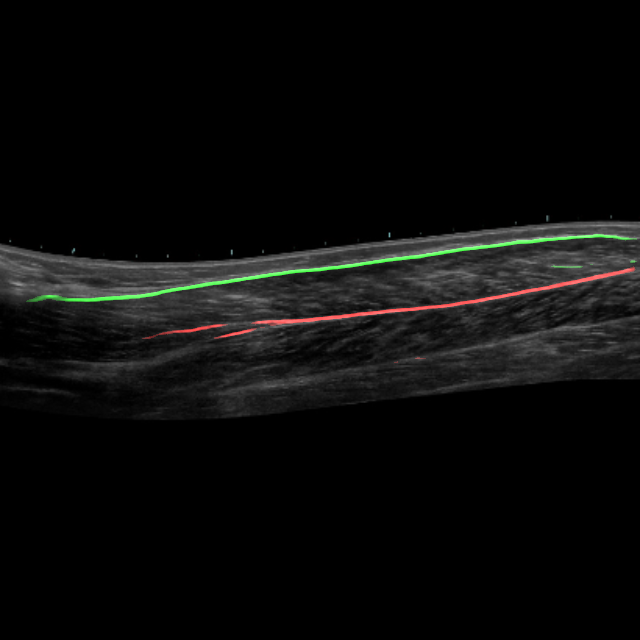

In [52]:
import cv2
import numpy as np
"""predicts a single image"""
# path to image
im_orig_path = "/content/gdrive/MyDrive/CACoM_multi/data/test_set/images/LB8EHBHS.png"

#read in and preprocess image (to fit the model input shape, (640x640x3) )
im_orig = cv2.imread(im_orig_path, 1)
im_reshape = preprocess_single(im_orig)

# perform prediction on image
pred = model.predict(np.expand_dims(im_reshape, axis = 0)).squeeze()
#pred = model.predict(np.expand_dims(preprocess_filter(im_reshape), axis = 0)).squeeze() #with extra preprocessing step!

# draw predicted lines on top of the image
im_pred = draw_prediction(im_reshape, pred, th=0.2)

# show prediction on image
cv2_imshow(im_pred)

## Predict Batch

In [54]:
test_folder = "/content/gdrive/MyDrive/CACoM_multi/data/test_set/images"
test_paths = sorted(os.listdir(test_folder))
ims = []

"""preprocess all images in folder and save to ims"""
for im_path in test_paths:
    path = os.path.join(test_folder, im_path)
    im = cv2.imread(path, 1)
    im = preprocess_single(im)
    ims.append(im)

In [55]:
"""perform prediction on each preprocessed image"""
pred = []
for im in ims:
    p = model.predict(np.expand_dims(im, axis = 0)).squeeze()
    #p = model.predict(np.expand_dims(preprocess_filter(im), axis = 0)).squeeze()
    pred.append(p)

In [56]:
"""draw prediction on each image"""
images_with_pred = []

for im, p in zip(ims, pred):
    concat_pred = draw_prediction(im, p.squeeze(), th=0.5)
    images_with_pred.append(concat_pred)

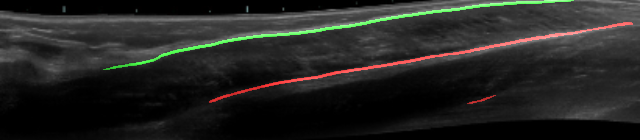

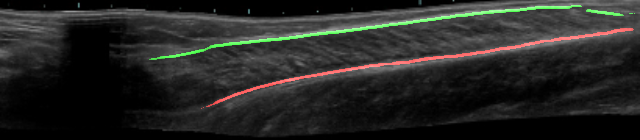

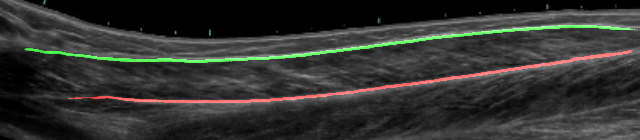

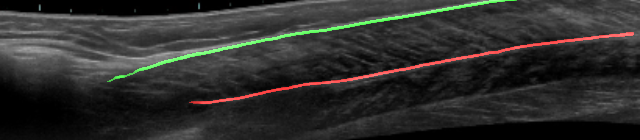

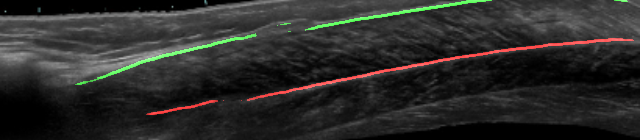

...

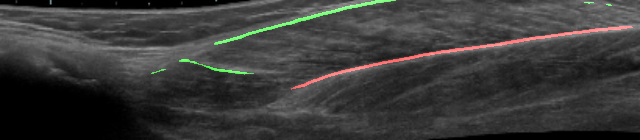

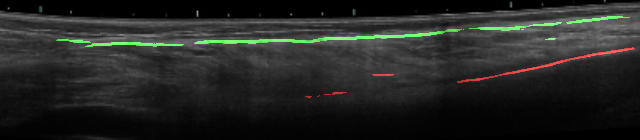

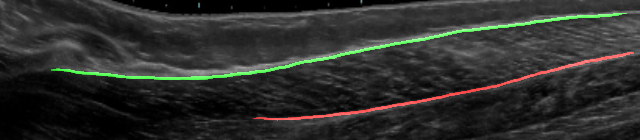

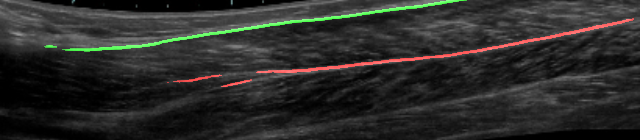

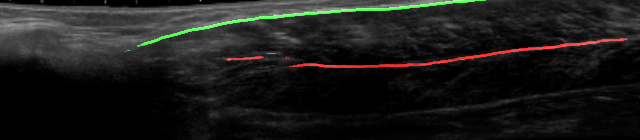

In [57]:
"""show relevant part of the images with predictions"""
for p in images_with_pred:
    cv2_imshow(p[250:-250])
    print()